In [1]:
# 1. GPU Verification & Environment Setup

import os
import glob
import shutil
import yaml
import torch
import sys
import xml.etree.ElementTree as ET
from tqdm import tqdm

# --- GPU CHECK ---
print("Checking for GPU availability...")
if not torch.cuda.is_available():
    print("CRITICAL ERROR: GPU NOT FOUND.")
    sys.exit(1)

device_to_use = 0
print(f"SUCCESS: Found GPU - {torch.cuda.get_device_name(0)}")

# Define Project Paths
BASE_DIR = os.path.normpath('C:/Users/MSC1/Desktop/Hoda/Deep-AS1/YOLO2')
DATA_PATH = os.path.join(BASE_DIR, 'yolo_data')
DATA_YAML = os.path.join(BASE_DIR, 'data.yaml')
PROJECT_NAME = os.path.normpath(os.path.join(BASE_DIR, 'yolo')) 
EXPERIMENT_NAME = 'yolov8-large-aligned-split'

# Direct paths to Faster R-CNN split folders
RCNN_TRAIN_DIR = os.path.normpath('C:/Users/MSC1/Desktop/Hoda/Deep-AS1/destination_folder/train')
RCNN_TEST_DIR = os.path.normpath('C:/Users/MSC1/Desktop/Hoda/Deep-AS1/destination_folder/test')

# Create YOLO folder structure
for path in ['images/train', 'images/val', 'labels/train', 'labels/val']:
    os.makedirs(os.path.join(DATA_PATH, path), exist_ok=True)

# 2. Data Preparation (XML to YOLO Conversion)
classes = ['OryxGazella', 'PantheraLeo', 'StruthioCamelus'] 

def convert_to_yolo(size, box):
    dw = 1. / size[0]
    dh = 1. / size[1]
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    return (x * dw, y * dh, w * dw, h * dh)

def process_xml_to_txt(xml_path, output_path):
    try:
        tree = ET.parse(xml_path)
        root = tree.getroot()
        size = root.find('size')
        w = int(size.find('width').text)
        h = int(size.find('height').text)

        with open(output_path, 'w') as f:
            for obj in root.findall('object'):
                cls = obj.find('name').text.strip()
                if cls not in classes: continue
                cls_id = classes.index(cls)
                xmlbox = obj.find('bndbox')
                b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text), 
                     float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
                bb = convert_to_yolo((w, h), b)
                f.write(f"{cls_id} {' '.join([f'{a:.6f}' for a in bb])}\n")
    except Exception as e:
        print(f"Error processing {xml_path}: {e}")

# 3. Aligned Data Migration Logic
def migrate_rcnn_split(source_dir, split_type):
    """
    Reads images from an existing R-CNN split folder, 
    copies images, and converts matching XMLs.
    """
    print(f"Migrating and converting {split_type} set from: {source_dir}")
    
    # Find all images in the source split folder
    images = []
    for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG']:
        images.extend(glob.glob(os.path.join(source_dir, ext)))
    
    for img_path in tqdm(images):
        filename = os.path.basename(img_path)
        name_no_ext = os.path.splitext(filename)[0]
        xml_path = os.path.join(source_dir, name_no_ext + ".xml")
        
        if os.path.exists(xml_path):
            # 1. Copy Image to YOLO structure
            shutil.copy(img_path, os.path.join(DATA_PATH, 'images', split_type, filename))
            # 2. Convert XML to YOLO TXT and save in labels folder
            output_txt = os.path.join(DATA_PATH, 'labels', split_type, name_no_ext + ".txt")
            process_xml_to_txt(xml_path, output_txt)
        else:
            print(f"Warning: Annotation missing for {filename}. Skipping.")

# Execute migration using the EXACT same folders as Faster R-CNN
migrate_rcnn_split(RCNN_TRAIN_DIR, 'train')
migrate_rcnn_split(RCNN_TEST_DIR, 'val') # R-CNN 'test' is used as YOLO 'val'

# Generate the data.yaml file automatically
dataset_config = {
    'path': DATA_PATH,
    'train': 'images/train',
    'val': 'images/val',
    'names': {i: cls for i, cls in enumerate(classes)}
}

with open(DATA_YAML, 'w') as f:
    yaml.dump(dataset_config, f, default_flow_style=False)
print(f"SUCCESS: Aligned data.yaml created at {DATA_YAML}")

# 4. Model Initialization & Training
from ultralytics import YOLO

model = YOLO('yolov8l.pt') 

print(f"Starting Aligned Training on GPU (Exact same split as Faster R-CNN)...")
results = model.train(
    data=DATA_YAML, 
    epochs=100, 
    imgsz=1024, 
    batch=8, 
    device=device_to_use, 
    project=PROJECT_NAME, 
    name=EXPERIMENT_NAME,
    exist_ok=True
)

Checking for GPU availability...
SUCCESS: Found GPU - NVIDIA GeForce RTX 4090
Migrating and converting train set from: C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\train


100%|██████████| 2434/2434 [00:04<00:00, 572.50it/s]


Migrating and converting val set from: C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\test


100%|██████████| 672/672 [00:01<00:00, 568.38it/s]


SUCCESS: Aligned data.yaml created at C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\data.yaml
Starting Aligned Training on GPU (Exact same split as Faster R-CNN)...
New https://pypi.org/project/ultralytics/8.3.249 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.240  Python-3.10.19 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0,

In [10]:
metrics = model.val(
        data=DATA_YAML, 
        imgsz=1024, 
        split='val',
        plots=True,
        save_json=True
    )

    # --- SPEED METRICS  ---
print("\n--- Inference Speed Metrics (per image) ---")
print(f"Pre-process:  {metrics.speed['preprocess']:.2f} ms")
print(f"Inference:    {metrics.speed['inference']:.2f} ms")
print(f"Post-process: {metrics.speed['postprocess']:.2f} ms")

total_speed = sum(metrics.speed.values())
print(f"Total Time:   {total_speed:.2f} ms")
print(f"Throughput:   {1000/total_speed:.2f} FPS")

Ultralytics 8.3.240  Python-3.10.19 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4090, 24564MiB)
val: Fast image access  (ping: 0.10.0 ms, read: 1368.2665.7 MB/s, size: 828.7 KB)
val: Scanning C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\yolo_data\labels\val.cache... 336 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 336/336 24.0Kit/s 0.0s
val: C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\yolo_data\images\val\StruthioCamelus_0435S6_Q05_R1_IMAG0028.jpg: corrupt JPEG restored and saved
val: C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\yolo_data\images\val\StruthioCamelus_0515S7_B07_R2_IMAG0016.jpg: corrupt JPEG restored and saved
val: C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\yolo_data\images\val\StruthioCamelus_0575S7_B07_R2_IMAG3885.jpg: corrupt JPEG restored and saved
val: C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\yolo_data\images\val\StruthioCamelus_0595S7_B08_R3_IMAG0185.jpg: corrupt JPEG restored and saved
val: C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\yolo_data\images\val\StruthioCame

Loading YOLOv8 model...
Running YOLO inference for OryxGazella_CDB_S1_B07_R1_IMAG0255.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\OryxGazella_CDB_S1_B07_R1_IMAG0255.jpg: 800x1024 1 OryxGazella, 16.7ms
Speed: 6.7ms preprocess, 16.7ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 1024)


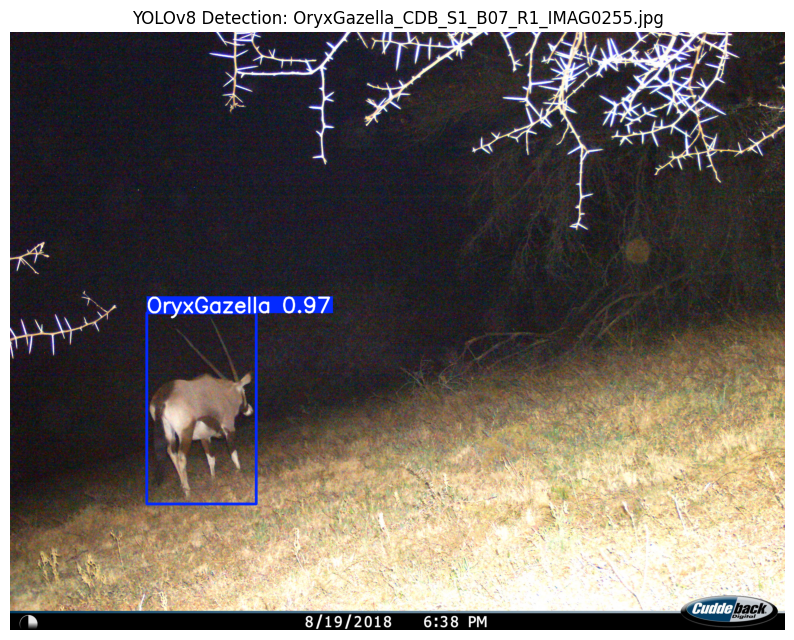

Running YOLO inference for OryxGazella_CDB_S1_C06_R1_IMAG0434.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\OryxGazella_CDB_S1_C06_R1_IMAG0434.jpg: 800x1024 1 OryxGazella, 23.0ms
Speed: 6.6ms preprocess, 23.0ms inference, 3.4ms postprocess per image at shape (1, 3, 800, 1024)


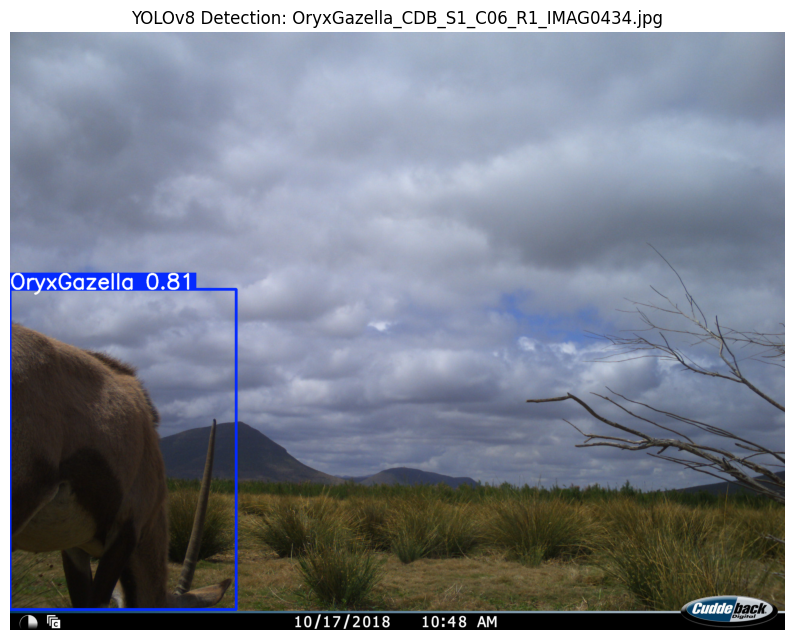

Running YOLO inference for OryxGazella_CDB_S1_C06_R2_IMAG0255.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\OryxGazella_CDB_S1_C06_R2_IMAG0255.jpg: 800x1024 1 OryxGazella, 17.9ms
Speed: 10.4ms preprocess, 17.9ms inference, 1.4ms postprocess per image at shape (1, 3, 800, 1024)


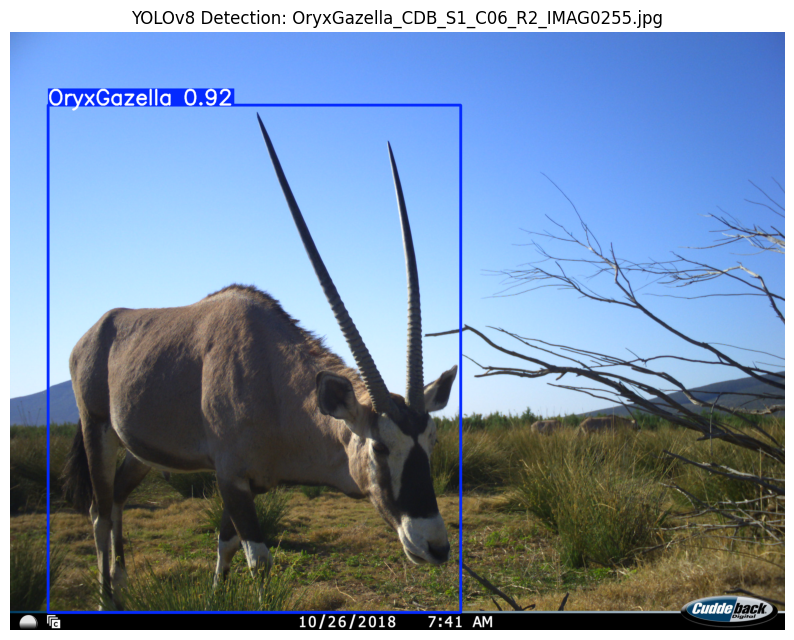

Running YOLO inference for OryxGazella_CDB_S1_D02_R2_IMAG0610.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\OryxGazella_CDB_S1_D02_R2_IMAG0610.jpg: 800x1024 1 OryxGazella, 16.8ms
Speed: 6.3ms preprocess, 16.8ms inference, 2.2ms postprocess per image at shape (1, 3, 800, 1024)


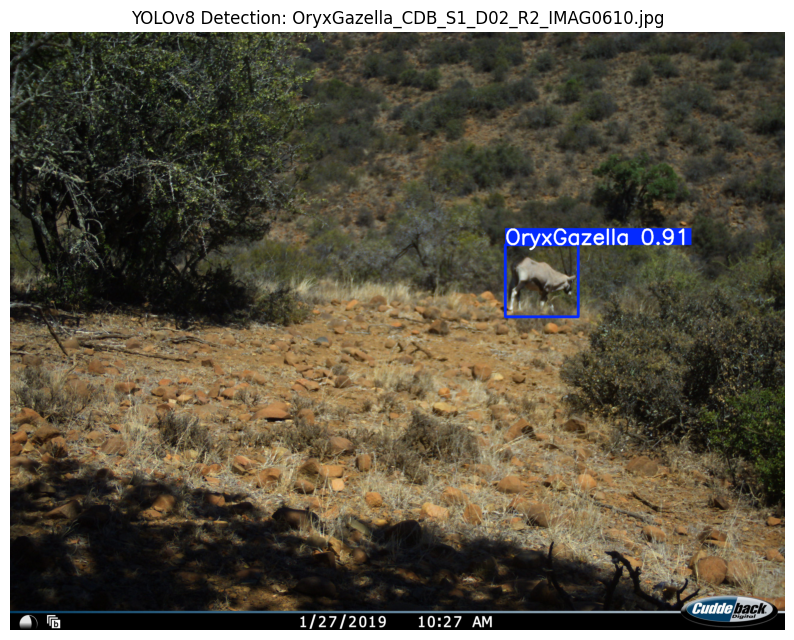

Running YOLO inference for OryxGazella_CDB_S1_D03_R1_IMAG0063.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\OryxGazella_CDB_S1_D03_R1_IMAG0063.jpg: 800x1024 1 OryxGazella, 171.4ms
Speed: 7.2ms preprocess, 171.4ms inference, 1.8ms postprocess per image at shape (1, 3, 800, 1024)


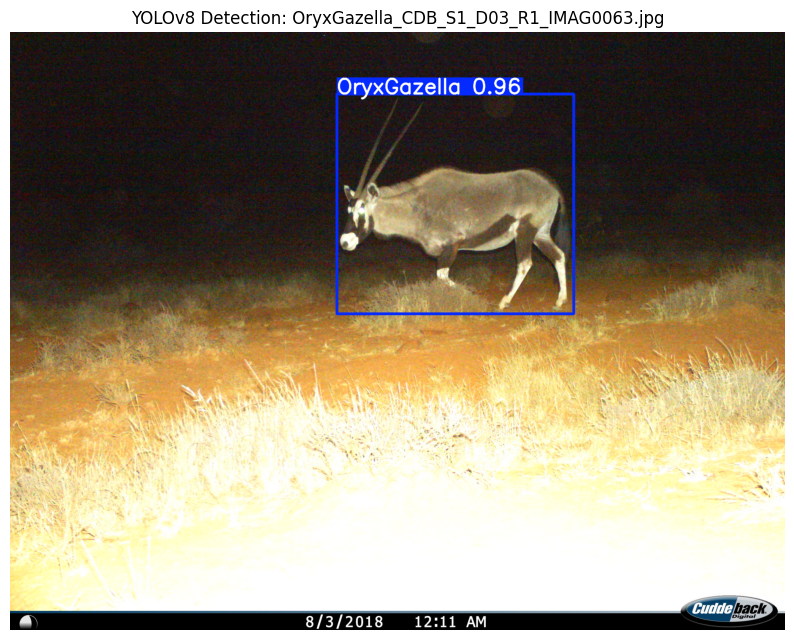

Running YOLO inference for PantheraLeo010.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\PantheraLeo010.jpg: 704x1024 1 PantheraLeo, 15.5ms
Speed: 4.8ms preprocess, 15.5ms inference, 1.3ms postprocess per image at shape (1, 3, 704, 1024)


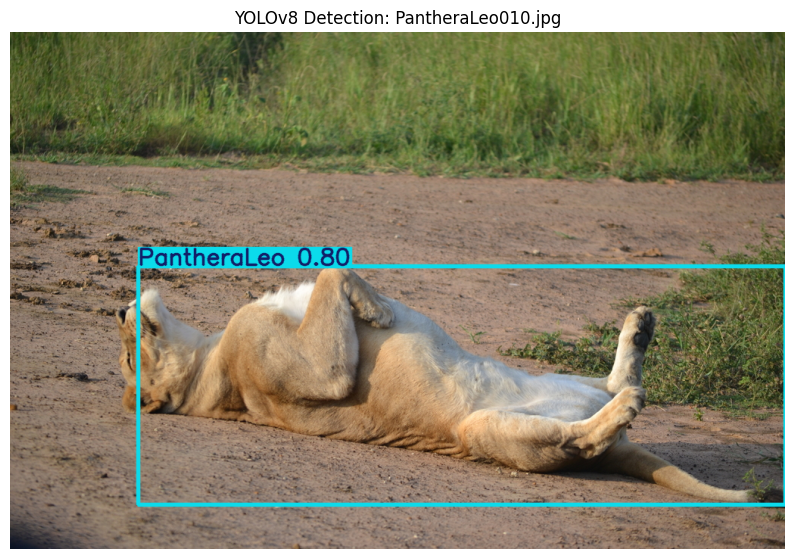

Running YOLO inference for PantheraLeo020.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\PantheraLeo020.jpg: 768x1024 2 PantheraLeos, 18.2ms
Speed: 3.9ms preprocess, 18.2ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1024)


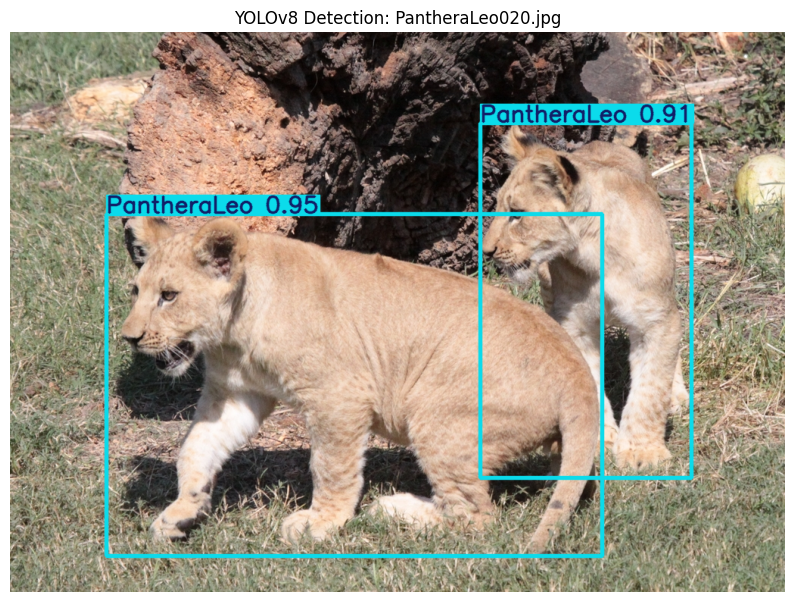

Running YOLO inference for PantheraLeo032.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\PantheraLeo032.jpg: 704x1024 1 PantheraLeo, 17.2ms
Speed: 3.8ms preprocess, 17.2ms inference, 1.4ms postprocess per image at shape (1, 3, 704, 1024)


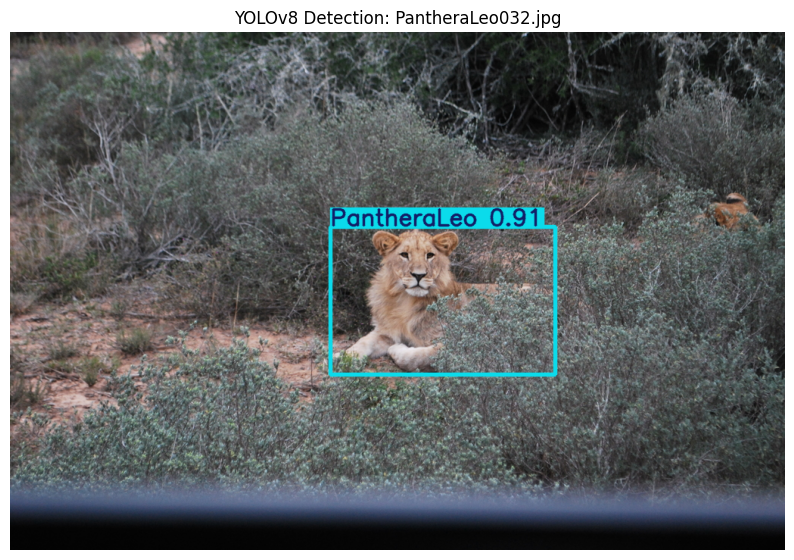

Running YOLO inference for PantheraLeo0908.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\PantheraLeo0908.jpg: 704x1024 1 PantheraLeo, 17.8ms
Speed: 3.3ms preprocess, 17.8ms inference, 3.8ms postprocess per image at shape (1, 3, 704, 1024)


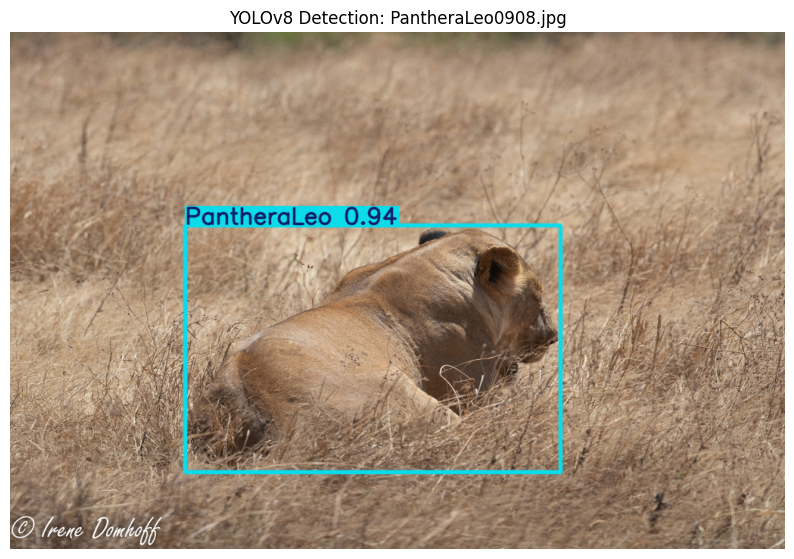

Running YOLO inference for StruthioCamelus_0435S6_Q05_R1_IMAG0028.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\StruthioCamelus_0435S6_Q05_R1_IMAG0028.jpg: 768x1024 1 StruthioCamelus, 15.5ms
Speed: 5.0ms preprocess, 15.5ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 1024)


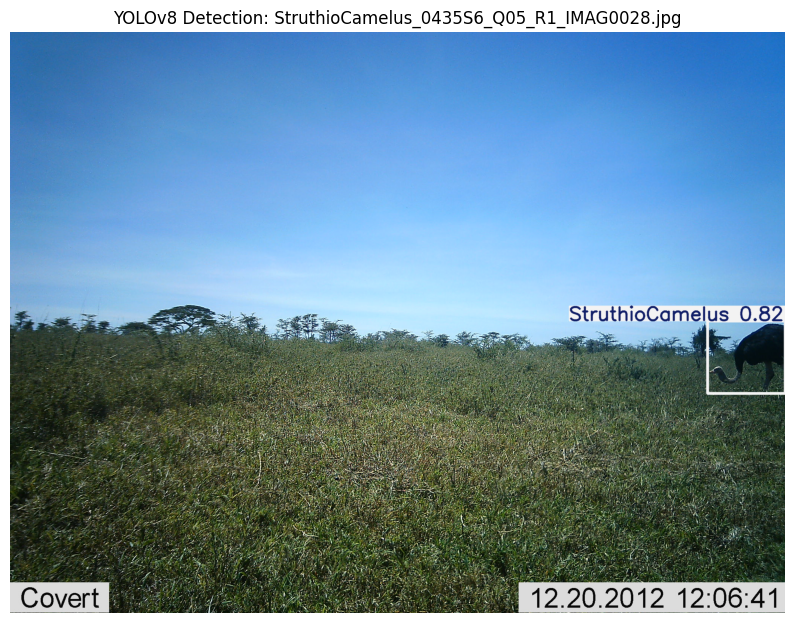

Running YOLO inference for StruthioCamelus_0645S7_B09_R3_IMAG1768.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\StruthioCamelus_0645S7_B09_R3_IMAG1768.jpg: 768x1024 1 StruthioCamelus, 41.4ms
Speed: 7.0ms preprocess, 41.4ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1024)


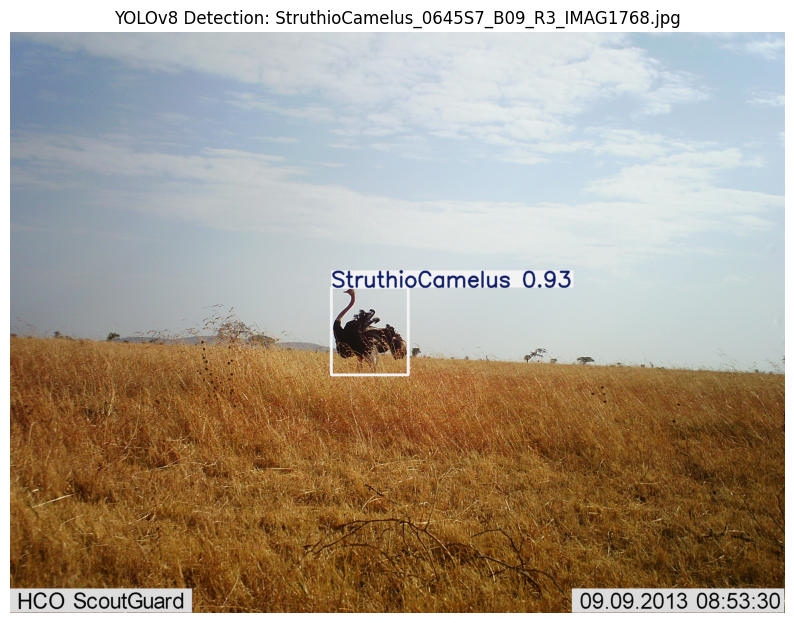

Running YOLO inference for StruthioCamelus_2215S7_M09_R2_IMAG0095.jpg...

image 1/1 C:\Users\MSC1\Desktop\Hoda\Deep-AS1\destination_folder\inference\StruthioCamelus_2215S7_M09_R2_IMAG0095.jpg: 768x1024 1 StruthioCamelus, 26.4ms
Speed: 5.1ms preprocess, 26.4ms inference, 1.8ms postprocess per image at shape (1, 3, 768, 1024)


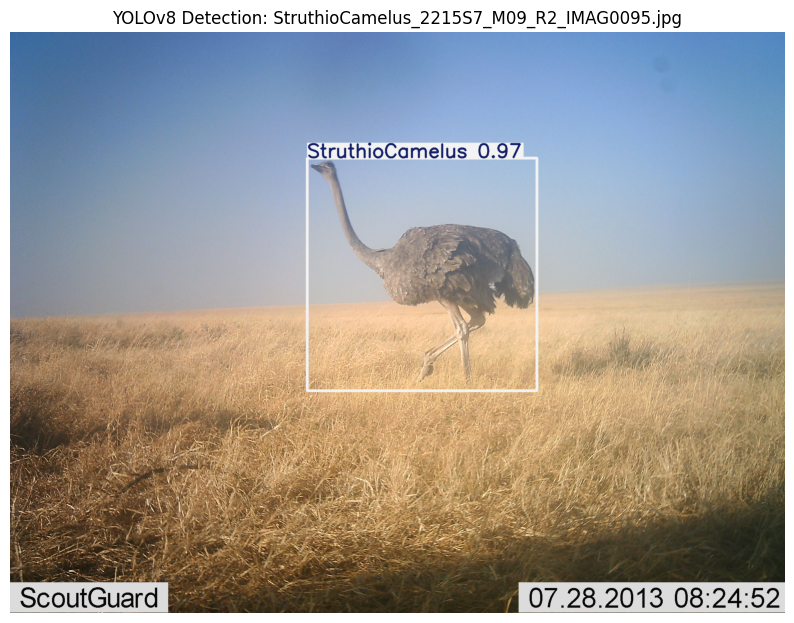

Inference complete.


In [5]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import numpy as np

# --- CONFIGURATION ---
# Path to YOLOv8 weights (.pt file)
PATH_TO_YOLO_MODEL = r"C:\Users\MSC1\Desktop\Hoda\Deep-AS1\YOLO2\yolo\yolov8-large-aligned-split\weights/best.pt" 

# Path to inference images
IMAGE_PATHS = r"C:/Users/MSC1/Desktop/Hoda/Deep-AS1/destination_folder/inference" # Update this to your image folder

# --- LOAD MODEL ---
print('Loading YOLOv8 model...')
model = YOLO(PATH_TO_YOLO_MODEL)

# --- INFERENCE LOOP ---
# Filter for image files only
image_files = [f for f in os.listdir(IMAGE_PATHS) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for file_name in image_files:
    image_path = os.path.join(IMAGE_PATHS, file_name)
    
    print(f'Running YOLO inference for {file_name}...')
    
    # Run inference

    results = model(image_path, conf=0.5) 

    # YOLOv8 returns a list of Results objects (one per image)
    for result in results:
        # result.plot() returns a BGR numpy array with boxes and labels drawn
        annotated_frame = result.plot()
        
        # Convert BGR (OpenCV format) to RGB (Matplotlib/PIL format)
        annotated_frame_rgb = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
        
        # Display
        plt.figure(figsize=(10, 8))
        plt.imshow(annotated_frame_rgb)
        plt.title(f"YOLOv8 Detection: {file_name}")
        plt.axis('off')
        plt.show()

print("Inference complete.")